In [2]:
# import essential modules 
import numpy as np
import pandas as pd
import cv2
import os
from glob import glob

import tensorflow as tf
import matplotlib.pyplot as plt

from keras.applications import ResNet50
from keras.models import Model, Sequential
from keras.utils import to_categorical, plot_model
from keras.preprocessing.sequence import pad_sequences
from keras.layers import Input, Dense, LSTM, Embedding, Dropout, add, Flatten, Convolution2D, TimeDistributed, Bidirectional, Activation, RepeatVector,Concatenate
from keras.callbacks import ModelCheckpoint
 


2024-05-02 16:00:57.199792: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-02 16:00:57.199946: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-02 16:00:57.341922: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [3]:
IMAGE_DIR = '/kaggle/input/flickr8k-sau/Flickr_Data/Images/'
# search for all  images with .jpg extention then return a list with al of it
images = glob(IMAGE_DIR+'*.jpg')
len(images)

8091

In [4]:
images[:5]

['/kaggle/input/flickr8k-sau/Flickr_Data/Images/3226254560_2f8ac147ea.jpg',
 '/kaggle/input/flickr8k-sau/Flickr_Data/Images/214543992_ce6c0d9f9b.jpg',
 '/kaggle/input/flickr8k-sau/Flickr_Data/Images/2366643786_9c9a830db8.jpg',
 '/kaggle/input/flickr8k-sau/Flickr_Data/Images/3368819708_0bfa0808f8.jpg',
 '/kaggle/input/flickr8k-sau/Flickr_Data/Images/2190227737_6e0bde2623.jpg']

In [100]:
images_len = len(images)

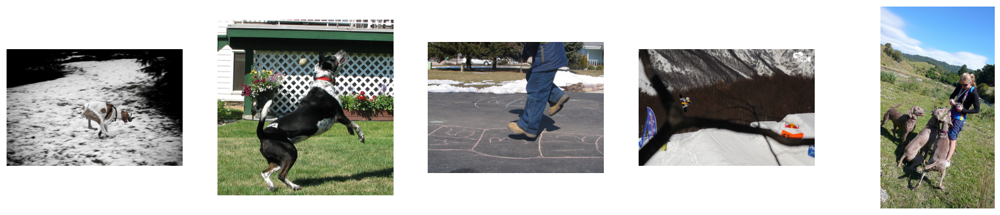

In [5]:
# plot top 5 images 

# Create a single figure with multiple subplots in a single row
plt.figure(figsize=(20, 4))  
for i in range(5):
    #read the image
    img = cv2.imread(images[i])
    # convert the image from BGR to RGB as  cv2 reads it as BGR and we need it as RGB
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    # Add a subplot for each image
    plt.subplot(1, 5, i+1)  # 1 row, 5 columns, ith subplot
    plt.imshow(img)
    plt.axis('off')  # Turn off axis

    
plt.show()



# Model creation


In [118]:
# Instantiate the ResNet50 model

# create resnet_model
resnet_model = ResNet50(include_top=True, weights='imagenet')
# do not include last layer as we need to make feature extraction not image calssification
last = resnet_model.layers[-2].output
# combine in final model
_model = Model(inputs = resnet_model.input,outputs = last)
# model summary
# model.summary()

In [7]:
path ='/kaggle/input/flickr8k-sau/Flickr_Data/Images/1000268201_693b08cb0e.jpg'
img_name = path.split('/')[-1]
img_name = img_name.split('.')[0]
img_name

'1000268201_693b08cb0e'

# Feature extraction


In [8]:
# Initialize an empty dictionary to store image features
images_features = {}
# Loop over the images
count = 0
for i in images:
    # Read, preprocess, and resize each image
    img = cv2.imread(i)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (224, 224))
    
    # Reshape the image array
    img = img.reshape(1, 224, 224, 3)
    # Predict using the ResNet50 model and reshape predictions => reshape here like Flattening the Features
    pred = _model.predict(img).reshape(2048,)
    # Extract image name and store features
    img_name = i.split('/')[-1] # the name here extracted from img path
    img_name = img_name.split('.')[0] # remove the extension
    images_features[img_name] = pred
    
    # Control the number of images processed
    count += 1
    if count > 1499 : # as we have more than 8000 image
        break
    elif count % 50 == 0:#  every 50 images, the current count is printed to provide progress updates
        print(count)





1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


I0000 00:00:1714665681.129965     108 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━

In [33]:
len(images_features)



1500

In [34]:
images_features['3226254560_2f8ac147ea']

array([6.2825650e-01, 7.8491288e-01, 5.6670183e-01, ..., 8.9139163e-01,
       4.5890709e-05, 0.0000000e+00], dtype=float32)

# Text process

In [35]:
CAPTION_DIR  ='/kaggle/input/flickr8k-sau/Flickr_Data/Flickr_TextData/Flickr8k.token.txt'
captions = open(CAPTION_DIR, 'r').read().split('\n')
len(captions)

40461

In [36]:
captions[:10]

['1000268201_693b08cb0e.jpg#0\tA child in a pink dress is climbing up a set of stairs in an entry way .',
 '1000268201_693b08cb0e.jpg#1\tA girl going into a wooden building .',
 '1000268201_693b08cb0e.jpg#2\tA little girl climbing into a wooden playhouse .',
 '1000268201_693b08cb0e.jpg#3\tA little girl climbing the stairs to her playhouse .',
 '1000268201_693b08cb0e.jpg#4\tA little girl in a pink dress going into a wooden cabin .',
 '1001773457_577c3a7d70.jpg#0\tA black dog and a spotted dog are fighting',
 '1001773457_577c3a7d70.jpg#1\tA black dog and a tri-colored dog playing with each other on the road .',
 '1001773457_577c3a7d70.jpg#2\tA black dog and a white dog with brown spots are staring at each other in the street .',
 '1001773457_577c3a7d70.jpg#3\tTwo dogs of different breeds looking at each other on the road .',
 '1001773457_577c3a7d70.jpg#4\tTwo dogs on pavement moving toward each other .']

In [37]:
path = '1000268201_693b08cb0e.jpg#0\tA child in a pink dress is climbing up a set of stairs in an entry way .'
img_name = path.split('\t')[0]
img_name = img_name.split('.')[0]
caption = path.split('\t')[1]
print('img_name : ', img_name)
print('caption : ', caption)


img_name :  1000268201_693b08cb0e
caption :  A child in a pink dress is climbing up a set of stairs in an entry way .


In [38]:
def process_caption(caption):
    # preprocessing text

    # convert to lower case
    caption = caption.lower()
    # delete digits and special characters etc.,
    caption = caption.replace('[A-Za-z]','')
    # delete addtional spaces
    caption = caption.replace('\s+', ' ')
    # add start and end tags to the caption
    caption = 'STARTSEQ   ' + " ".join([word for word in caption.split() if len(word)>1])  + '    ENDSEQ'
    return caption

In [39]:
# initialize Captions Dictionary:
captions_dict = {}

# Loop Through Captions:
for i in captions:
    
    # Split Caption into Image Name and Caption Text
    parts = i.split('\t')
    img_name = parts[0].split('#')[0]  # Extract image name without index suffix
    caption =  " ".join(parts[1:] )  # Join caption parts back together as a string
    img_name = img_name.split('.')[0] # remove jpg extension
    
    caption = process_caption(caption)
    # Check if Image Name Exists in Image Features
    if img_name in images_features:
        # Add Caption to Captions Dictionary
        if img_name not in captions_dict:
            captions_dict[img_name] = [caption]
        else:
            captions_dict[img_name].append(caption)

        




In [40]:
len(captions_dict)

1500

In [41]:
# Print the top 5 elements in captions_dict
count = 0
for img_name, captions_list in captions_dict.items():
    print(f"Image Name: {img_name}")
    print("Captions:")
    for caption in captions_list:
        print(f"- {caption}")
    count += 1
    if count >= 5:
        break


Image Name: 1002674143_1b742ab4b8
Captions:
- STARTSEQ   little girl covered in paint sits in front of painted rainbow with her hands in bowl    ENDSEQ
- STARTSEQ   little girl is sitting in front of large painted rainbow    ENDSEQ
- STARTSEQ   small girl in the grass plays with fingerpaints in front of white canvas with rainbow on it    ENDSEQ
- STARTSEQ   there is girl with pigtails sitting in front of rainbow painting    ENDSEQ
- STARTSEQ   young girl with pigtails painting outside in the grass    ENDSEQ
Image Name: 102351840_323e3de834
Captions:
- STARTSEQ   man drilling hole in the ice    ENDSEQ
- STARTSEQ   man is drilling through the frozen ice of pond    ENDSEQ
- STARTSEQ   person in the snow drilling hole in the ice    ENDSEQ
- STARTSEQ   person standing on frozen lake    ENDSEQ
- STARTSEQ   two men are ice fishing    ENDSEQ
Image Name: 1024138940_f1fefbdce1
Captions:
- STARTSEQ   two different breeds of brown and white dogs play on the beach    ENDSEQ
- STARTSEQ   two dogs ar

# Visualize images with captions

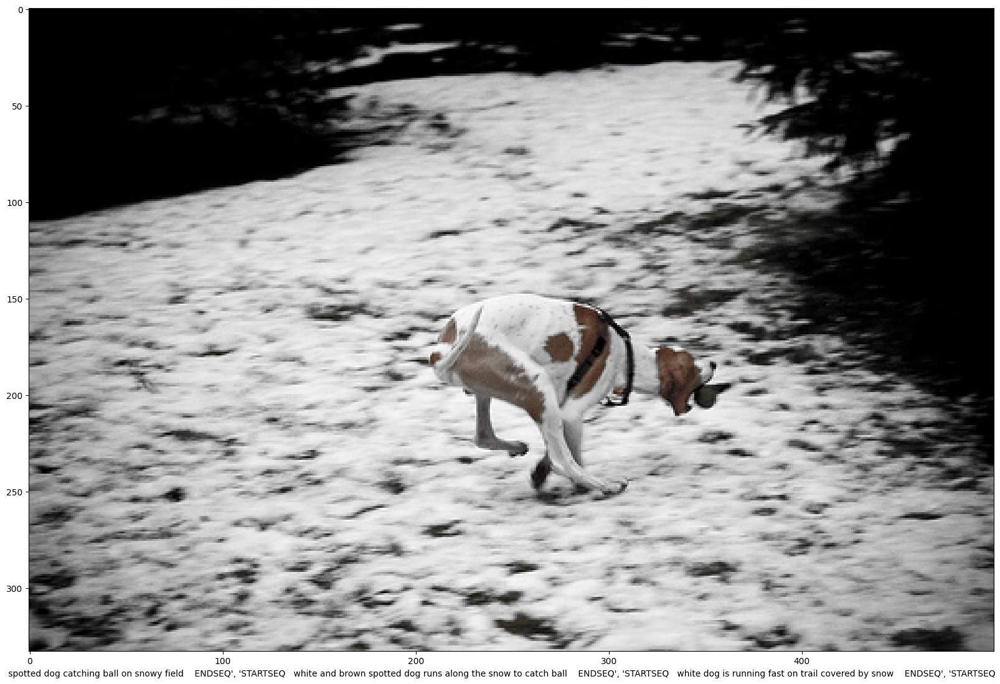

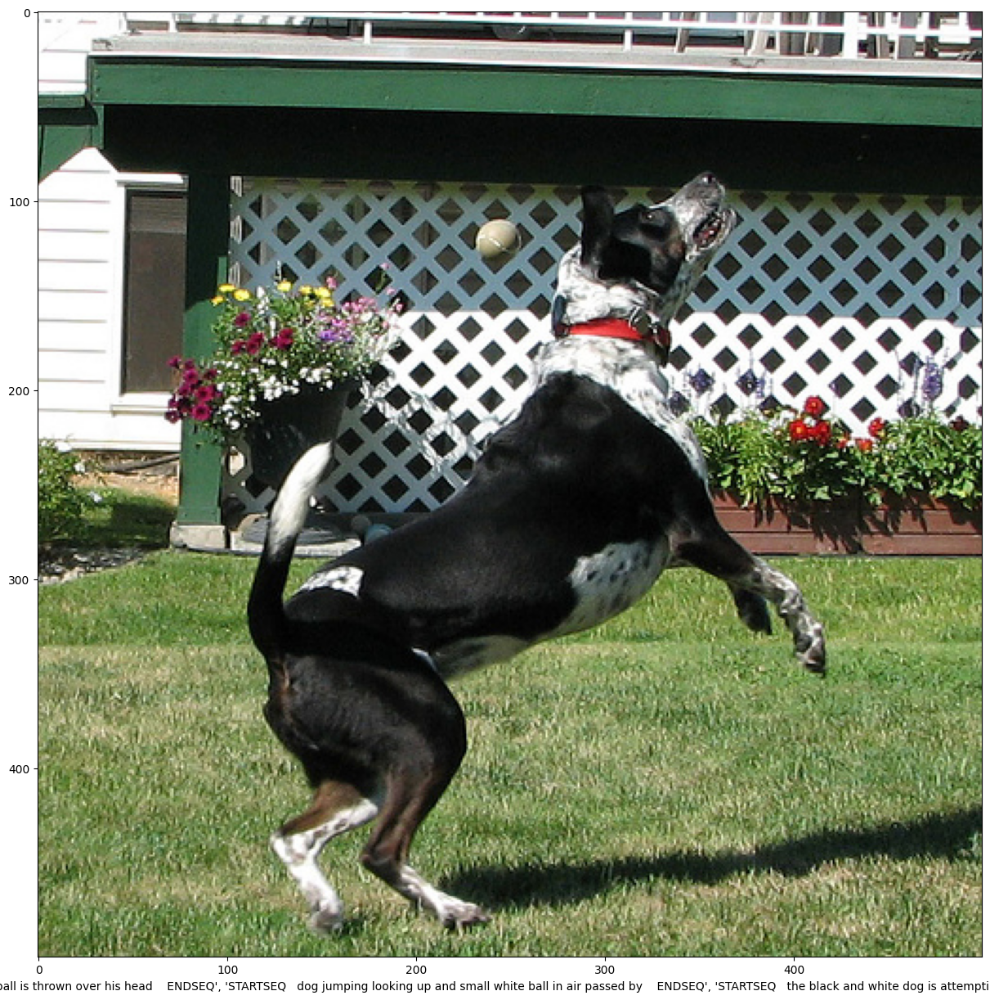

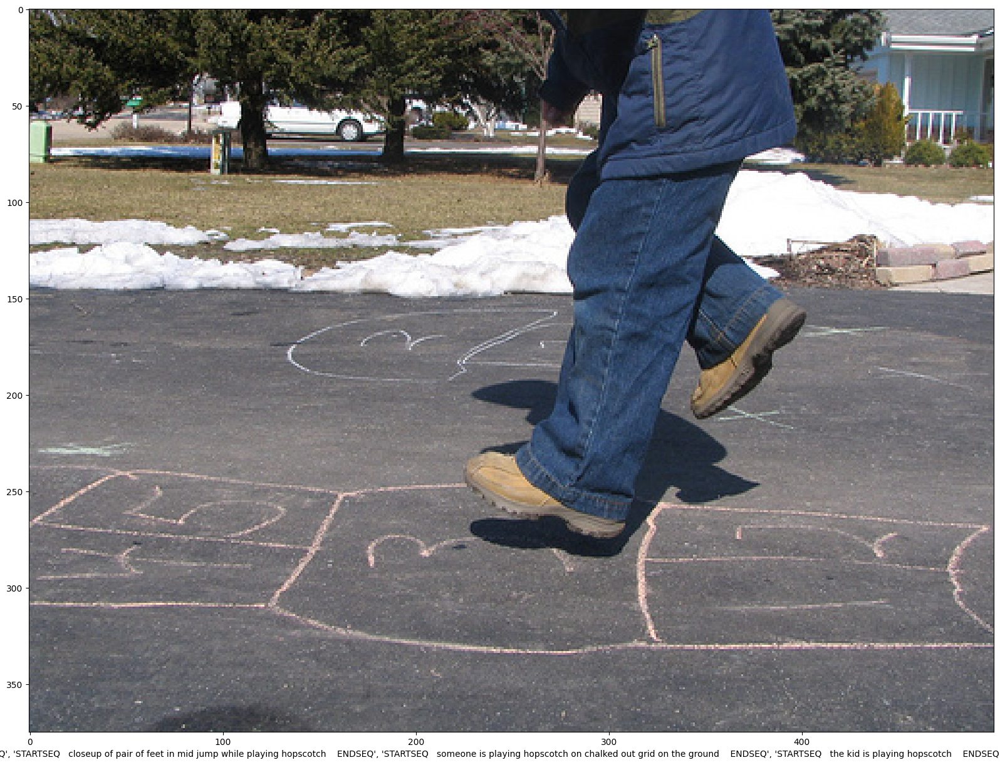

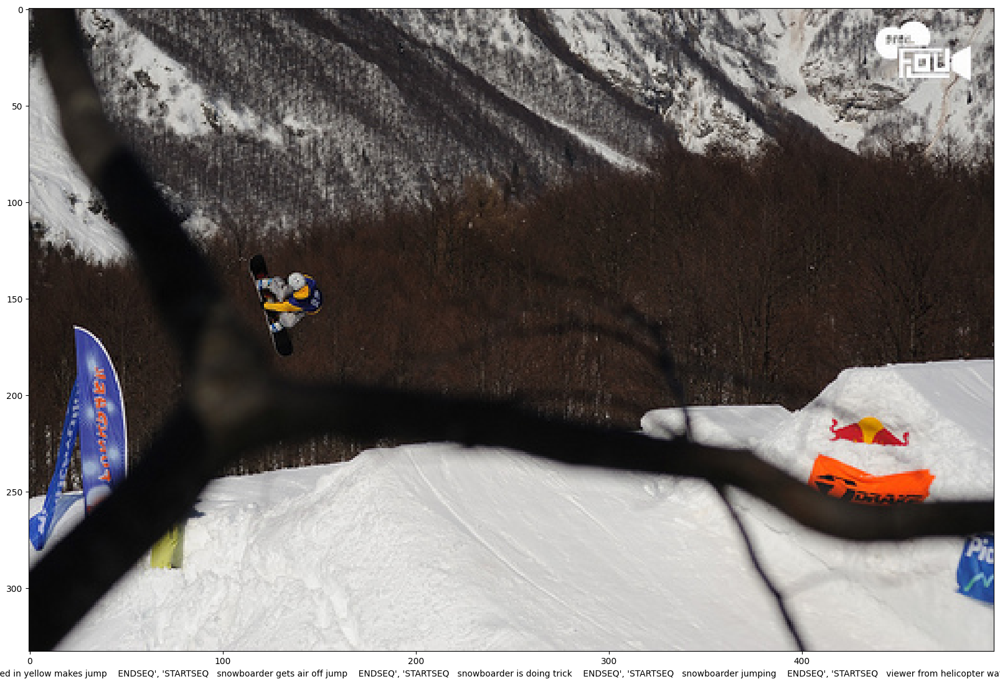

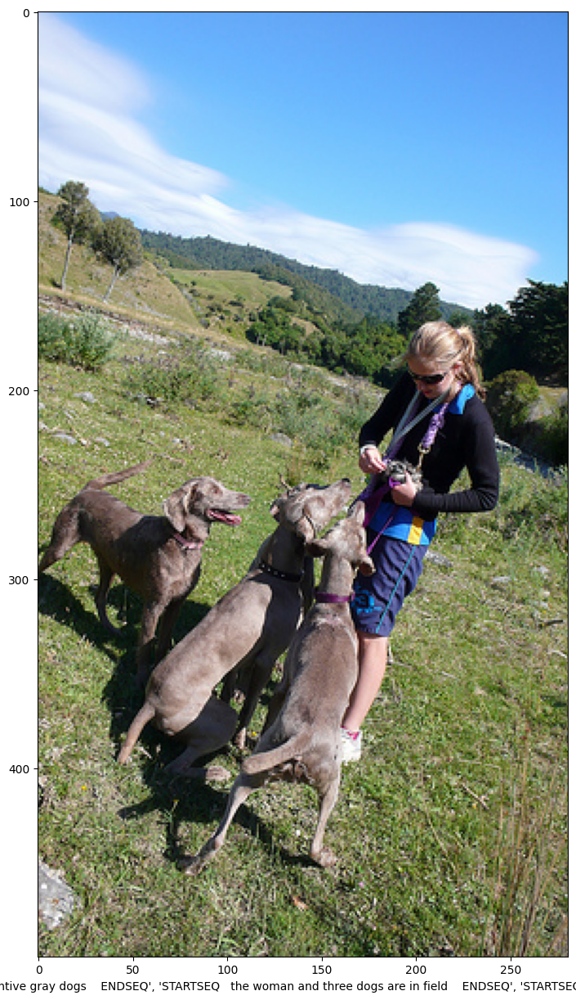

In [42]:
for i in range(5):
    
    plt.figure(figsize = (20, 15))
    img_name = images[i]    
    img = cv2.imread(img_name)
    
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_name = img_name.split('/')[-1]
    plt.xlabel(captions_dict[img_name.split('.')[0]])
    plt.imshow(img)


# Create vocabulary

In [44]:
#  creating a vocabulary by counting the occurrences of each word in the captions. Let's break down the code
# Initialize Vocabulary Dictionary
count_words = {}
# Iterate Over Captions
for img_name, _captions in captions_dict.items():
    for _caption in _captions:
        words = _caption.split()
        _words = set(words) # Use set to count each word only once per caption
        for word in _words:  
            if word not in count_words:
                count_words[word] = 1
            else:
                count_words[word] += 1

In [45]:
len(count_words)

4051

In [46]:
THRESH = -1
count = 1
new_dict = {}
# Iterate Over Words and Assign Indices:
for k,v in count_words.items():
    if count_words[k] > THRESH:
        new_dict[k] = count
        count += 1

In [47]:
len(new_dict)

4051

In [48]:
new_dict['OUT'] = len(new_dict) 

In [49]:
captions_backup = captions_dict.copy()

In [50]:
# Iterating Over Captions:
for img_name, _captions in captions_dict.items():
    # Encoding Words in Captions
    for idx, _caption in enumerate(_captions):
        encoded = []
        for word in _caption.split():  
            if word not in new_dict:
                encoded.append(new_dict['<OUT>'])
            else:
                encoded.append(new_dict[word])

        # Replace original caption with encoded sequence
        captions_dict[img_name][idx] = encoded
# This process helps convert the textual data into a format that can be understood by machine learning models

In [51]:
first_img_name, first_captions = next(iter(captions_dict.items()))
print("First Image Name:", first_img_name)
print("Captions for the First Image:", first_captions)


First Image Name: 1002674143_1b742ab4b8
Captions for the First Image: [[7, 13, 3, 12, 11, 5, 16, 11, 8, 15, 9, 6, 10, 4, 14, 11, 1, 2], [7, 13, 3, 19, 18, 11, 8, 15, 17, 9, 6, 2], [7, 22, 3, 11, 21, 27, 25, 10, 28, 11, 8, 15, 23, 20, 10, 6, 26, 24, 2], [7, 30, 19, 3, 10, 31, 18, 11, 8, 15, 6, 29, 2], [7, 33, 3, 10, 31, 29, 32, 11, 21, 27, 2]]


# Build Generator Function

In [52]:
#  find the maximum length of any caption (MAX_LEN). While doing so, it prints out the longest caption found in the process.
MAX_LEN = 0
for k, vv in captions_dict.items():
    for v in vv:
        if len(v) > MAX_LEN:
            MAX_LEN = len(v)
            print(v)

[7, 13, 3, 12, 11, 5, 16, 11, 8, 15, 9, 6, 10, 4, 14, 11, 1, 2]
[7, 22, 3, 11, 21, 27, 25, 10, 28, 11, 8, 15, 23, 20, 10, 6, 26, 24, 2]
[7, 73, 293, 37, 16, 300, 53, 299, 26, 297, 32, 73, 294, 224, 298, 292, 295, 46, 296, 2]
[7, 3, 10, 92, 543, 97, 43, 11, 21, 542, 15, 539, 548, 10, 547, 539, 546, 71, 21, 545, 2]
[7, 21, 3, 10, 21, 92, 543, 97, 53, 243, 120, 19, 43, 11, 21, 542, 15, 21, 486, 541, 548, 2]
[7, 21, 128, 11, 21, 76, 119, 19, 701, 694, 696, 462, 125, 259, 21, 128, 11, 21, 242, 380, 702, 71, 615, 148, 90, 2]
[7, 21, 47, 33, 174, 46, 11, 123, 53, 23, 1045, 53, 1046, 312, 279, 11, 1043, 319, 46, 66, 1044, 273, 37, 1047, 11, 1045, 53, 358, 2]
[7, 312, 183, 23, 201, 19, 32, 21, 153, 467, 23, 201, 10, 123, 2253, 26, 437, 300, 19, 146, 80, 620, 461, 153, 312, 142, 562, 273, 517, 1096, 2]


In [28]:
MAX_LEN

31

In [29]:
x=[]
for key, value in captions_dict.items():
    x.append(len(value))

In [30]:
set(x)

{5}

In [31]:
first_img_name, first_captions = next(iter(captions_dict.items()))
print("First Image Name:", first_img_name)
print("Captions for the First Image:", first_captions)


First Image Name: 1002674143_1b742ab4b8
Captions for the First Image: [[7, 13, 3, 12, 11, 5, 16, 11, 8, 15, 9, 6, 10, 4, 14, 11, 1, 2], [7, 13, 3, 19, 18, 11, 8, 15, 17, 9, 6, 2], [7, 22, 3, 11, 21, 27, 25, 10, 28, 11, 8, 15, 23, 20, 10, 6, 26, 24, 2], [7, 30, 19, 3, 10, 31, 18, 11, 8, 15, 6, 29, 2], [7, 33, 3, 10, 31, 29, 32, 11, 21, 27, 2]]


In [32]:
Batch_size = 5000
VOCAB_SIZE = len(new_dict)

def generator(photo, caption):
    '''
    photo: image features => keys (image names), values => feature vectors.
    caption: captions => keys (image names), values => lists of captions associated with each image.
    '''
    X = []  # input images
    y_in = []  # input sequences
    y_out = []  # output sequences

    for k, vv in caption.items():
        for v in vv:
            for i in range(1, len(v)):
                X.append(photo[k])

                in_seq= [v[:i]]  # input sequence
                out_seq = v[i]  # output word

                in_seq = pad_sequences(in_seq, maxlen=MAX_LEN, padding='post', truncating='post')[0]  # padding the sequence to maxlen

                # converts class vectors (integers) to binary class matrices (one-hot encoded vectors).
                out_seq = to_categorical([out_seq], num_classes=VOCAB_SIZE)[0]

                # Append padded sequences directly
                y_out.append(out_seq)
                y_in.append(in_seq)

                
                # Limit y_out sequence to match y_in sequence length
                if len(y_out) == MAX_LEN:
                    break


    return X, y_in,y_out


# Split the data for train and test



In [53]:
from sklearn.model_selection import train_test_split

# Split data into train and test sets
train_image_names, test_image_names = train_test_split(list(images_features.keys()), test_size=0.2, random_state=42)

# Generate train data
train_X, train_y_in, train_y_out = generator({k: images_features[k] for k in train_image_names}, 
                                              {k: captions_dict[k] for k in train_image_names})

# Generate test data
test_X, test_y_in, test_y_out = generator({k: images_features[k] for k in test_image_names}, 
                                          {k: captions_dict[k] for k in test_image_names})

In [54]:
len(train_X), len(train_y_in), len(train_y_out)

(61677, 61677, 61677)

In [57]:
len(test_X), len(test_y_in), len(test_y_out)

(15650, 15650, 15650)

In [55]:
# conversion here to prepare it to feed to neural network
train_X = np.array(train_X)
train_y_in = np.array(train_y_in, dtype='float64')
train_y_out = np.array(train_y_out, dtype='float64')



In [58]:

test_X = np.array(test_X)
test_y_in = np.array(test_y_in, dtype='float64')
test_y_out = np.array(test_y_out, dtype='float64')


In [56]:
train_X.shape, train_y_in.shape, train_y_out.shape

((61677, 2048), (61677, 31), (61677, 4052))

In [59]:
test_X.shape, test_y_in.shape, test_y_out.shape

((15650, 2048), (15650, 31), (15650, 4052))

# NLP  model


In [69]:
from keras.models import Model
from keras.layers import Concatenate, Dense, Activation, LSTM, Input

# Define input layers for both image and language models
image_input = Input(shape=(2048,))
language_input = Input(shape=(MAX_LEN,))
embedding_size=50
# Define the image model
image_output = Dense(embedding_size, input_shape=(2048,), activation='relu')(image_input)
image_output = RepeatVector(MAX_LEN)(image_output)

# Define the language model
language_output = Embedding(input_dim=VOCAB_SIZE, output_dim=embedding_size, input_length=MAX_LEN)(language_input)
language_output = LSTM(256, return_sequences=True)(language_output)
language_output = TimeDistributed(Dense(embedding_size))(language_output)

# Concatenate the outputs of both models
combined_output = Concatenate(axis=-1)([image_output, language_output])

# Pass the concatenated output through an LSTM layer with 128 units
lstm_output = LSTM(128, return_sequences=True)(combined_output)
# # Pass the output of the previous LSTM layer through another LSTM layer with 512 units. It returns only the last output.
# lstm_output = LSTM(512, return_sequences=False)(x)


# Define the final output layer
lstm_1 = LSTM(512, return_sequences=False)(lstm_output)
final_output = Dense(VOCAB_SIZE)(lstm_1)
final_output = Activation('softmax')(final_output)

# Define the combined model
model = Model(inputs=[image_input, language_input], outputs=final_output)

# Compile the model with categorical cross-entropy loss, RMSprop optimizer, and accuracy metric
model.compile(loss='categorical_crossentropy', optimizer='RMSprop', metrics=['accuracy'])

# Print summary of the combined model
model.summary()



Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4       │ (None, 31)        │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ input_layer_3       │ (None, 2048)      │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ embedding_1         │ (None, 31, 50)    │    202,600 │ input_layer_4[0]… │
│ (Embedding)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_3 (Dense)     │ (None, 50)        │    102,450 │ input_layer_3[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_3 (LSTM)       │ (None, 31, 256)   │    314,368 │ embedding_1[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_1     │ (None, 31, 50)    │          0 │ dense_3[0][0]     │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ time_distributed_1  │ (None, 31, 50)    │     12,850 │ lstm_3[0][0]      │
│ (TimeDistributed)   │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_1       │ (None, 31, 100)   │          0 │ repeat_vector_1[… │
│ (Concatenate)       │                   │            │ time_distributed… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_4 (LSTM)       │ (None, 31, 128)   │    117,248 │ concatenate_1[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_5 (LSTM)       │ (None, 512)       │  1,312,768 │ lstm_4[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_5 (Dense)     │ (None, 4052)      │  2,078,676 │ lstm_5[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 4052)      │          0 │ dense_5[0][0]     │
│ (Activation)        │                   │            │                   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 4,140,960 (15.80 MB)

 Trainable params: 4,140,960 (15.80 MB)

 Non-trainable params: 0 (0.00 B)

In [70]:
history = model.fit([train_X, train_y_in], train_y_out, batch_size=512, epochs=50, validation_data=([test_X, test_y_in], test_y_out))


Epoch 1/50
121/121 ━━━━━━━━━━━━━━━━━━━━ 15s 83ms/step - accuracy: 0.0891 - loss: 6.1630 - val_accuracy: 0.0958 - val_loss: 5.7684
Epoch 2/50
121/121 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.0968 - loss: 5.6254 - val_accuracy: 0.0958 - val_loss: 5.7009
Epoch 3/50
121/121 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.0993 - loss: 5.5506 - val_accuracy: 0.0917 - val_loss: 5.6459
Epoch 4/50
121/121 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.0946 - loss: 5.4694 - val_accuracy: 0.0929 - val_loss: 5.5994
Epoch 5/50
121/121 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.0940 - loss: 5.3551 - val_accuracy: 0.0916 - val_loss: 5.5637
Epoch 6/50
121/121 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.0954 - loss: 5.2675 - val_accuracy: 0.0958 - val_loss: 5.5775
Epoch 7/50
121/121 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.0952 - loss: 5.1921 - val_accuracy: 0.0918 - val_loss: 5.5770
Epoch 8/50
121/121 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - accuracy: 0.0946 - loss: 5.1091 - val_acc

# Visualize training process


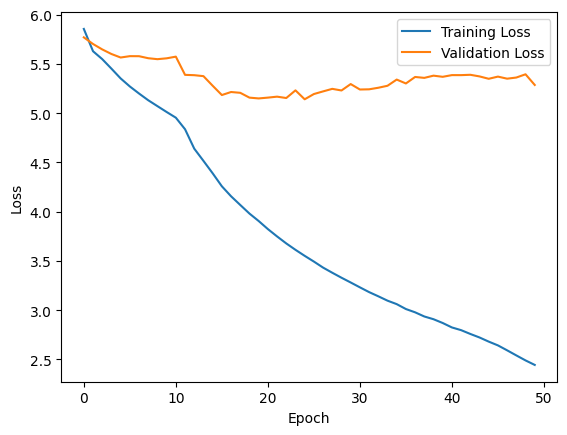

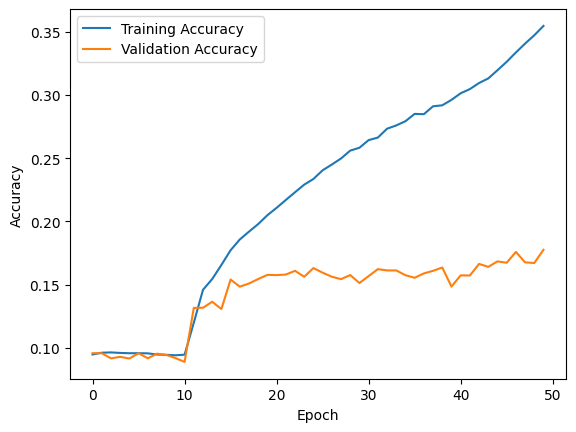

In [72]:
# Plot training loss
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Plot training accuracy
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Model prediction



In [73]:

# Generate captions for test images
predicted_captions = model.predict([test_X, test_y_in])

490/490 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step


# Model evaluation

In [77]:
from nltk.translate.bleu_score import corpus_bleu
# Compute BLEU score
bleu_score = corpus_bleu([[caption] for caption in test_y_out], predicted_captions)
bleu_score

# Visualize test process


In [81]:

new_dict_reverse = {idx: word for word, idx in new_dict.items()}


In [83]:
model.save('model.h5')

In [85]:
model.save_weights('mine_model.weights.h5')

In [86]:
np.save('vocab.npy', new_dict)

# Visualize model architecture

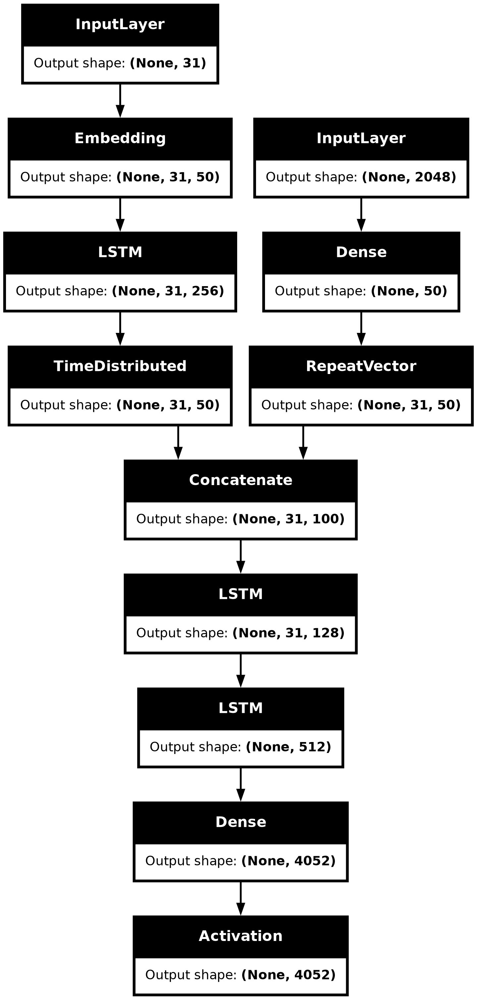

In [98]:
# Visualize model architecture
plot_model(model, to_file='model.png', show_shapes=True)

In [109]:
print("Image Features Shape:", image_features.shape)
print("True Caption Shape:", true_caption.shape)


Image Features Shape: (2048,)
True Caption Shape: (31,)


In [110]:
inv_dict = {v:k for k, v in new_dict.items()}

In [157]:
def getImageFeatures(i):
     # Read, preprocess, and resize each image
    img = cv2.imread(i)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (224, 224))
    
    # Reshape the image array
    img = img.reshape(1, 224, 224, 3)
    # Predict using the ResNet50 model and reshape predictions => reshape here like Flattening the Features
    pred = _model.predict(img).reshape(2048,)
    return pred

/kaggle/input/flickr8k-sau/Flickr_Data/Images/2502007071_82a8c639cf.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


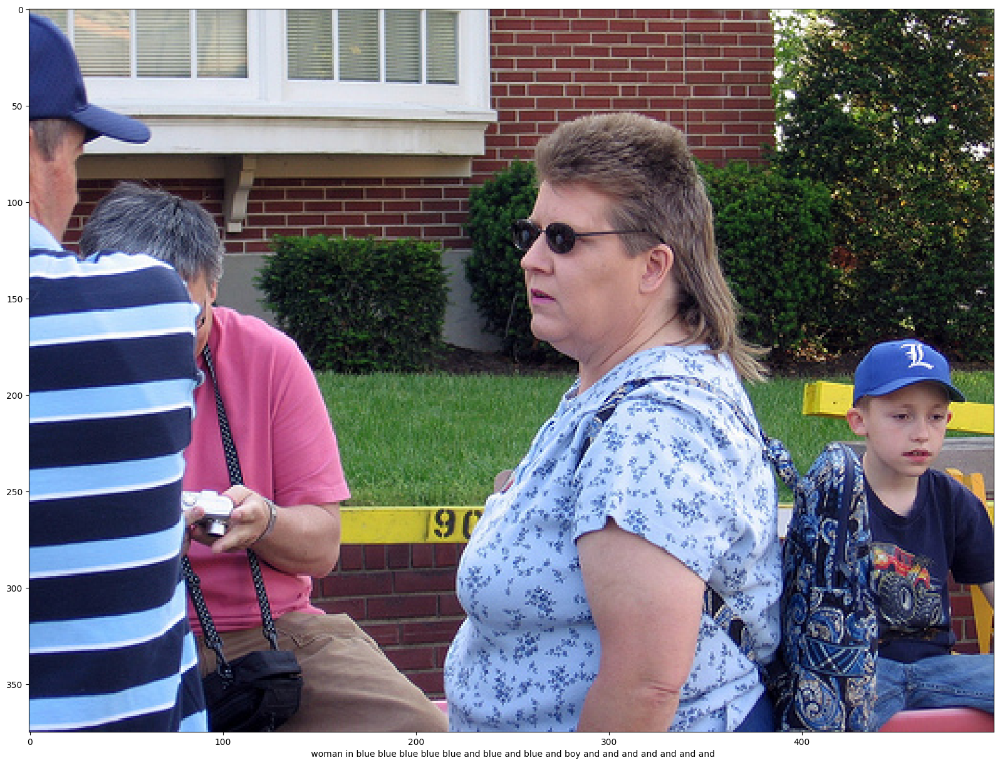

/kaggle/input/flickr8k-sau/Flickr_Data/Images/2425262733_afe0718276.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


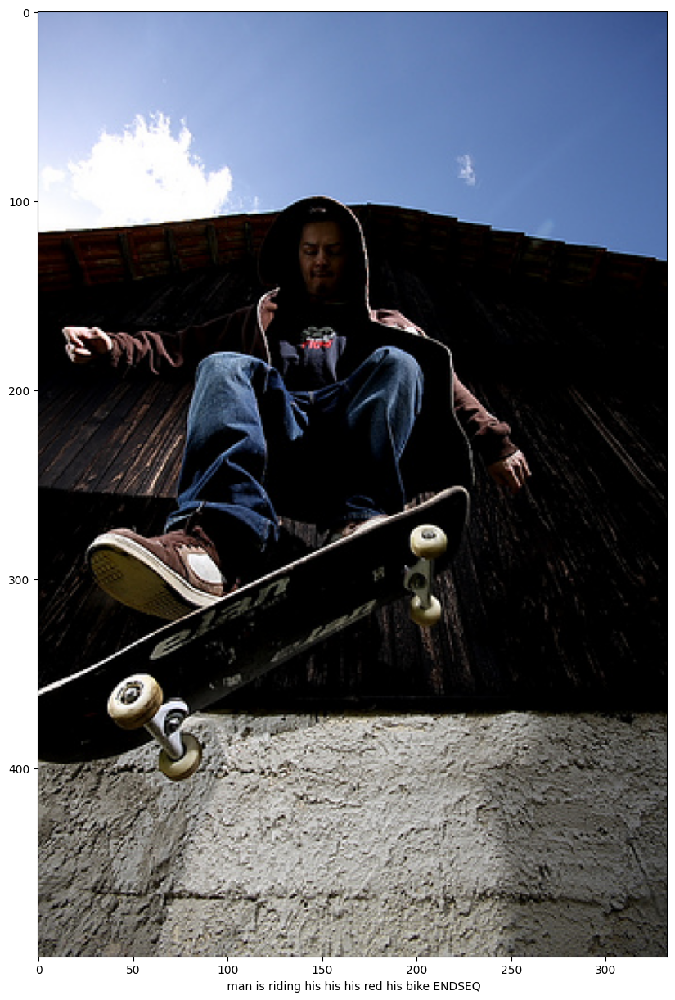

/kaggle/input/flickr8k-sau/Flickr_Data/Images/3205336477_037d4b6bd9.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


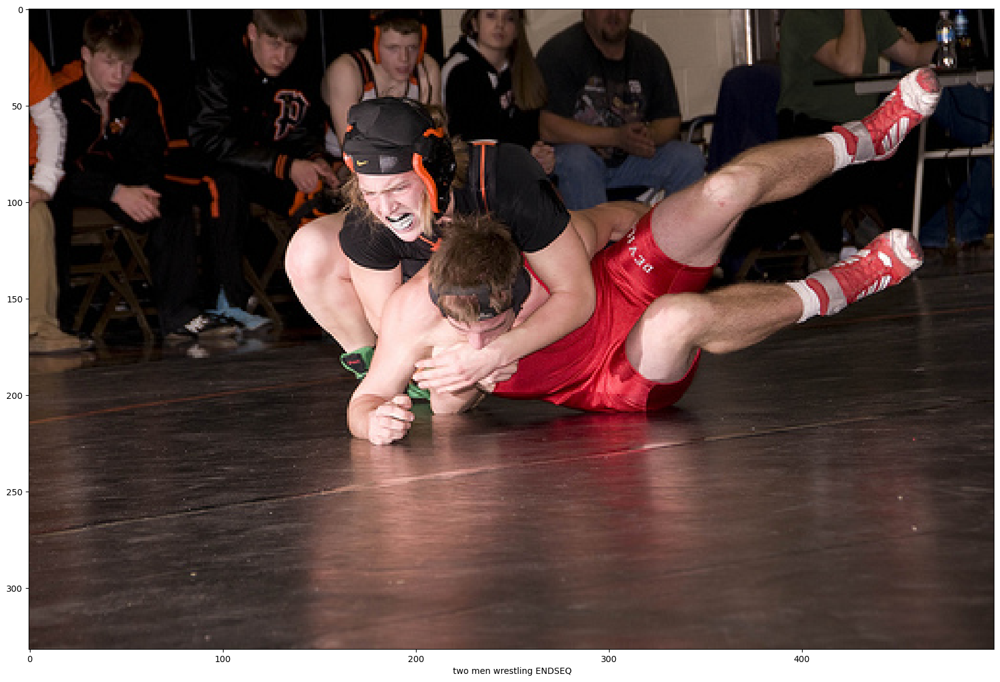

/kaggle/input/flickr8k-sau/Flickr_Data/Images/3499720588_c32590108e.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


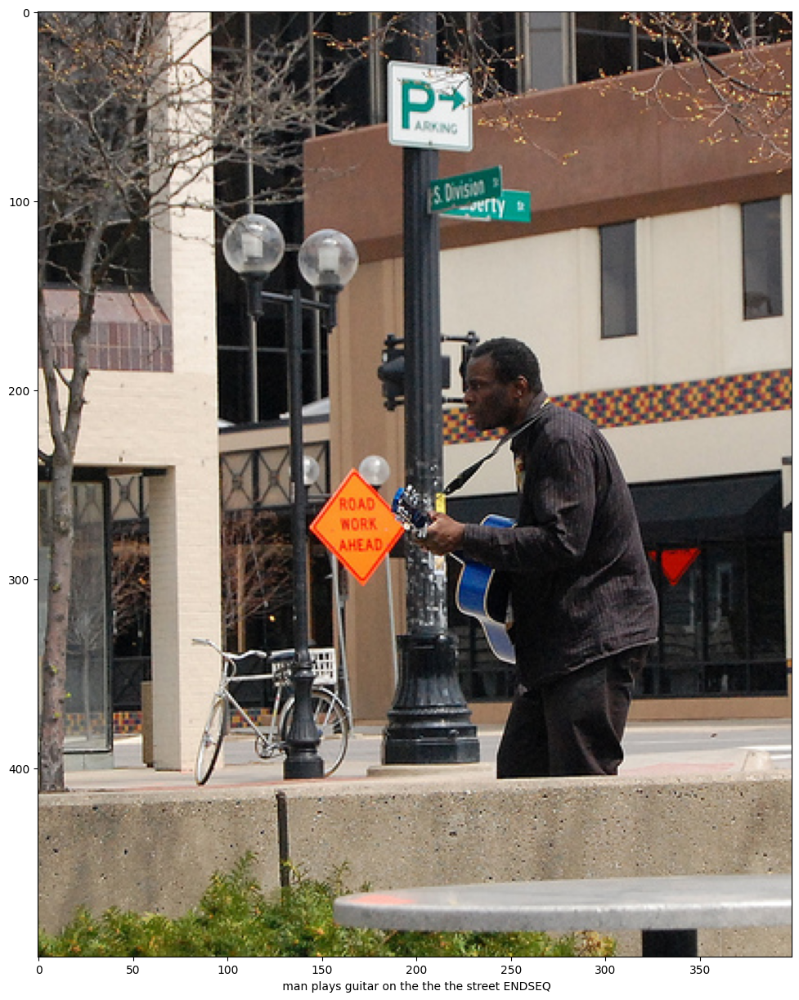

/kaggle/input/flickr8k-sau/Flickr_Data/Images/3350671534_2a5d45a961.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


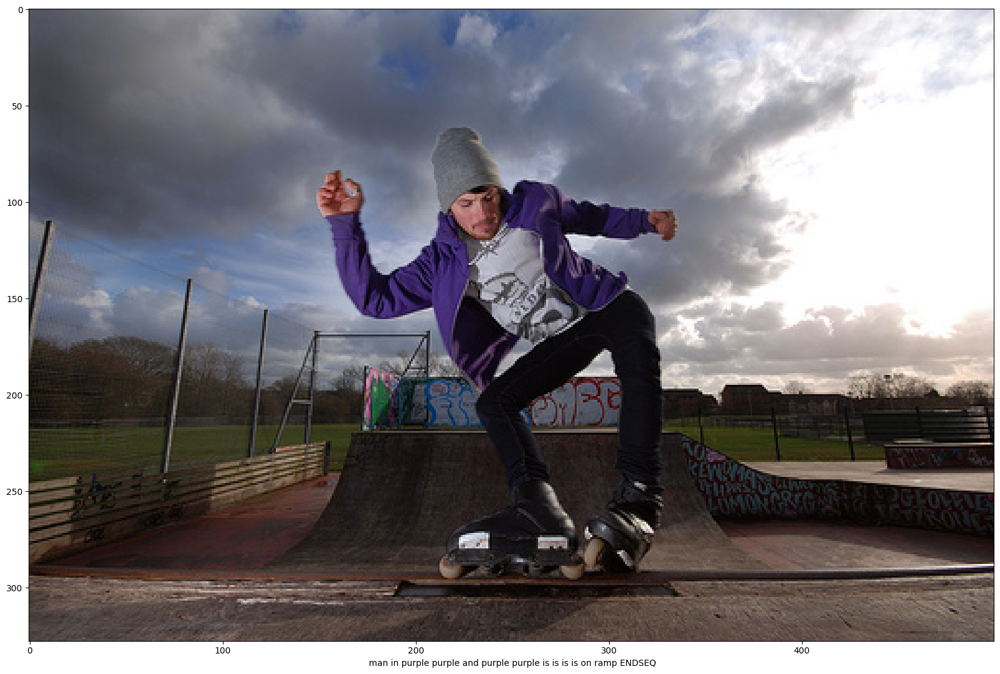

In [204]:
import numpy as np

# Generate a list of 5 random numbers between 1500 and 7000
img_idx = np.random.randint(1000, 1500, size=5).tolist()

for idx in img_idx:
     # Load and preprocess the image
    img = images[idx]
    print(img)
    test_feature = getImageFeatures(img)

    # Initialize caption and text input
    caption = ''
    text_inp = ['STARTSEQ']

    # Generate caption
    count = 0
    while count < 20:
        count += 1

       
        test_feature = np.array(test_feature)  # Convert to NumPy array
        test_feature = test_feature.reshape(1, 2048)  # Reshape to (1, 2048)

        # Encode text input
        encoded = [new_dict[word] for word in text_inp]
        encoded = [encoded]
        encoded = pad_sequences(encoded, padding='post', truncating='post', maxlen=MAX_LEN)
        encoded = np.array(encoded, dtype='float64')  # Convert to NumPy array
        encoded = encoded.reshape(1, MAX_LEN)  # Reshape to (1, MAX_LEN)
    

        # Predict next word
        prediction = np.argmax(model.predict([test_feature, encoded]))

        # Get sampled word
        sampled_word = inv_dict[prediction]
        caption += ' ' + sampled_word

        # Break if end token is generated
        if sampled_word == 'ENDSEQ':
            break

        # Update text input
        text_inp.append(sampled_word)

    # Visualize the image and caption
    #read the image
    image = cv2.imread(img)
    # convert the image from BGR to RGB as  cv2 reads it as BGR and we need it as RGB
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.figure(figsize = (20, 15))
    plt.imshow(image_rgb)
    plt.xlabel(caption)
    plt.show()


/kaggle/input/flickr8k-sau/Flickr_Data/Images/3674168459_6245f4f658.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


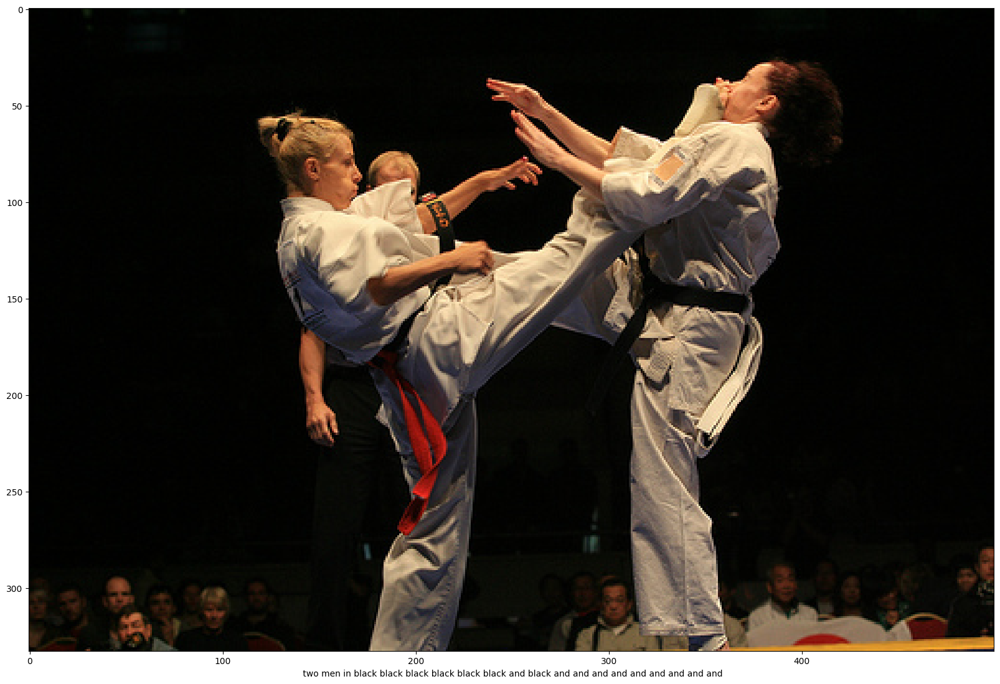

/kaggle/input/flickr8k-sau/Flickr_Data/Images/3356700488_183566145b.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


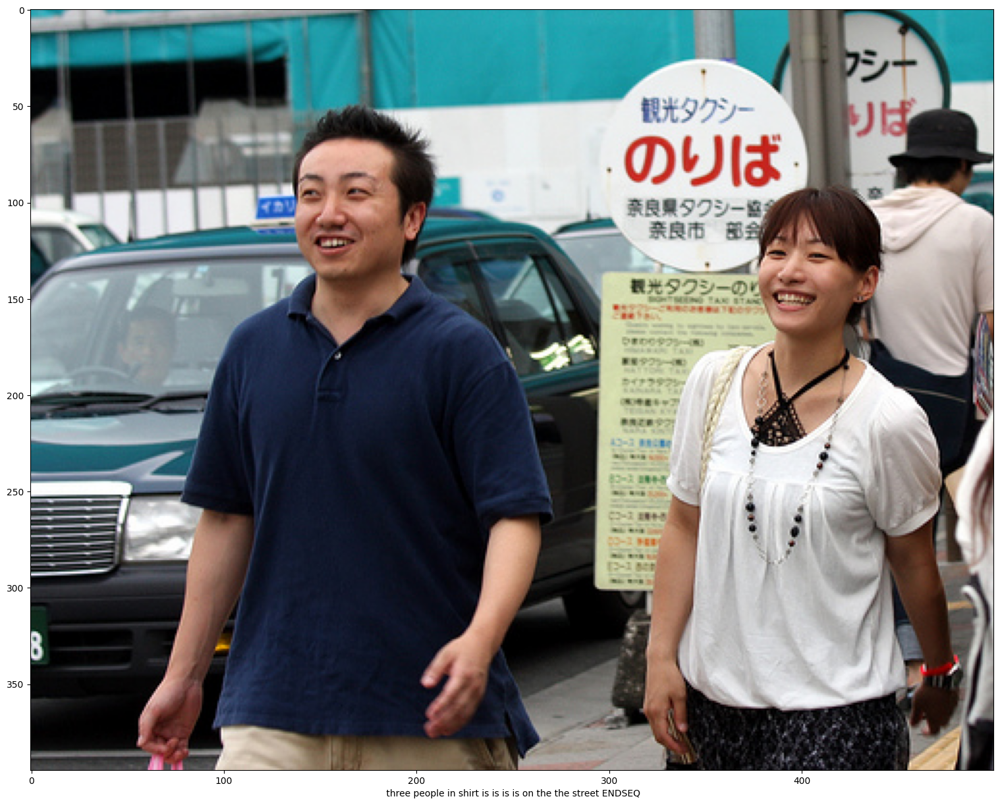

/kaggle/input/flickr8k-sau/Flickr_Data/Images/454686980_7517fe0c2e.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


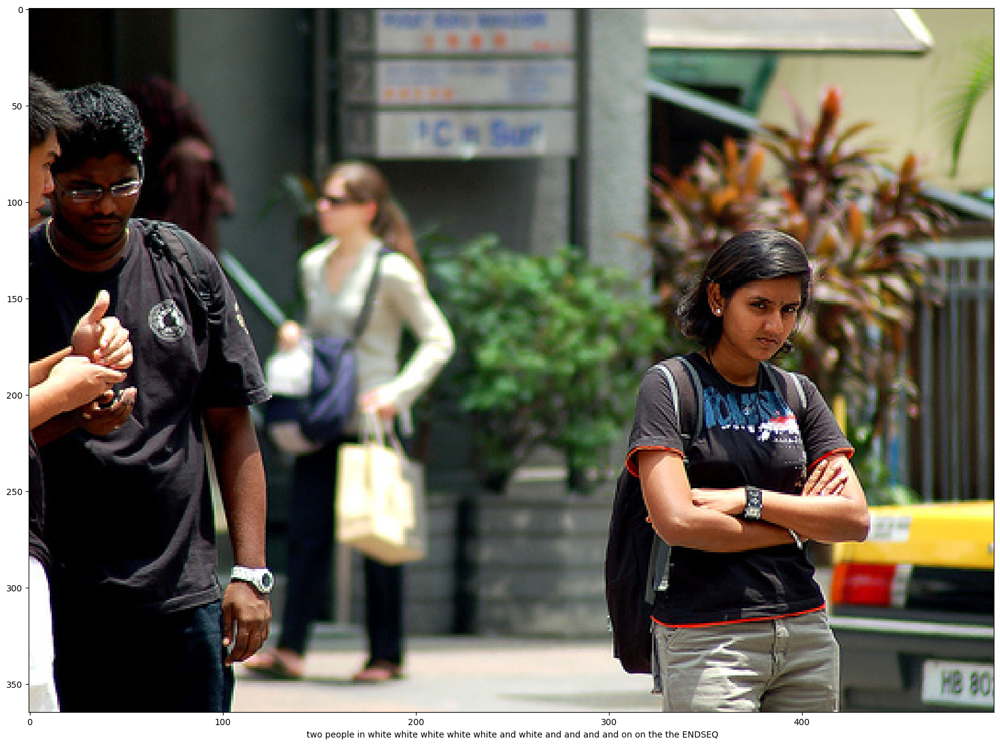

/kaggle/input/flickr8k-sau/Flickr_Data/Images/2350400382_ced2b6c91e.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


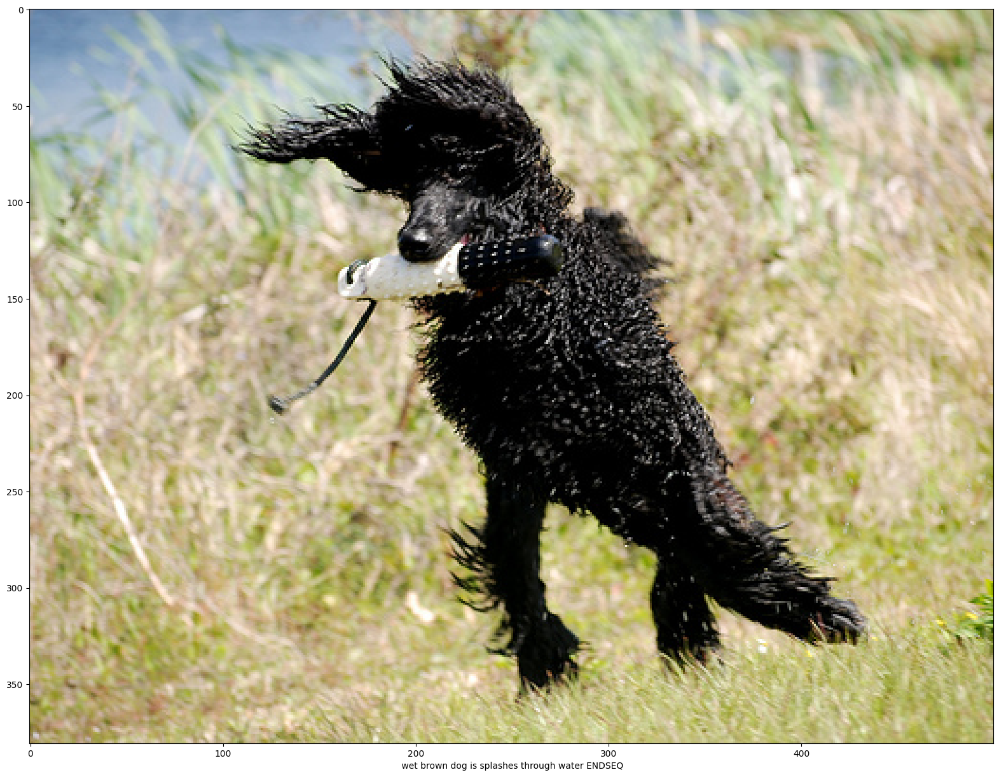

/kaggle/input/flickr8k-sau/Flickr_Data/Images/3119696225_b289efaec8.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


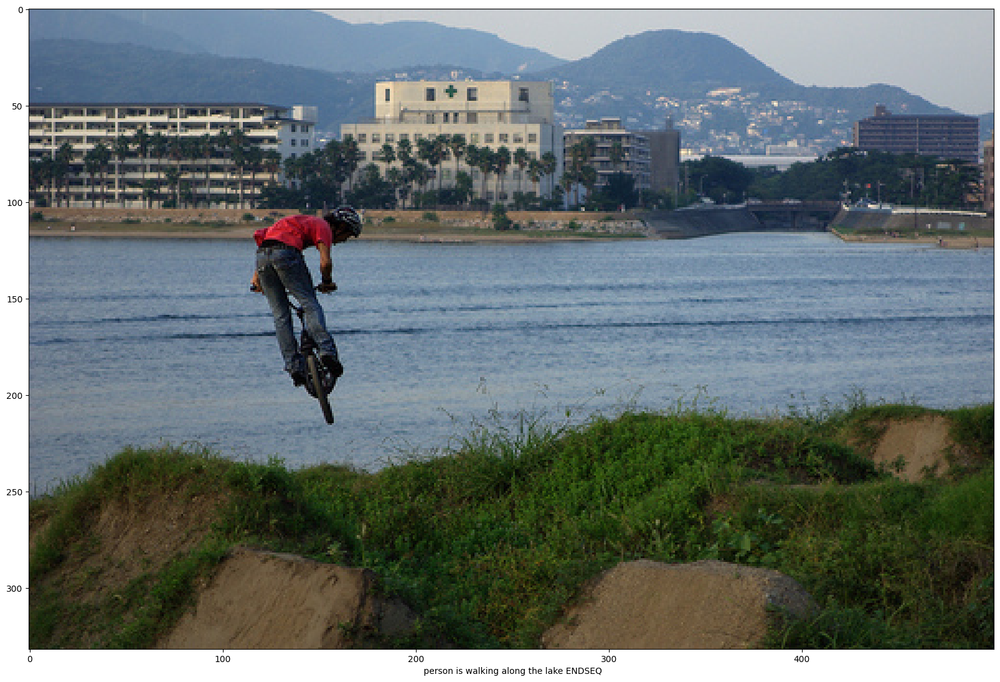

In [205]:
import numpy as np

# Generate a list of 5 random numbers between 1500 and 7000
img_idx = np.random.randint(1500, 8000, size=5).tolist()

for idx in img_idx:
     # Load and preprocess the image
    img = images[idx]
    print(img)
    test_feature = getImageFeatures(img)

    # Initialize caption and text input
    caption = ''
    text_inp = ['STARTSEQ']

    # Generate caption
    count = 0
    while count < 20:
        count += 1

       
        test_feature = np.array(test_feature)  # Convert to NumPy array
        test_feature = test_feature.reshape(1, 2048)  # Reshape to (1, 2048)

        # Encode text input
        encoded = [new_dict[word] for word in text_inp]
        encoded = [encoded]
        encoded = pad_sequences(encoded, padding='post', truncating='post', maxlen=MAX_LEN)
        encoded = np.array(encoded, dtype='float64')  # Convert to NumPy array
        encoded = encoded.reshape(1, MAX_LEN)  # Reshape to (1, MAX_LEN)
    

        # Predict next word
        prediction = np.argmax(model.predict([test_feature, encoded]))

        # Get sampled word
        sampled_word = inv_dict[prediction]
        caption += ' ' + sampled_word

        # Break if end token is generated
        if sampled_word == 'ENDSEQ':
            break

        # Update text input
        text_inp.append(sampled_word)

    # Visualize the image and caption
    #read the image
    image = cv2.imread(img)
    # convert the image from BGR to RGB as  cv2 reads it as BGR and we need it as RGB
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.figure(figsize = (20, 15))
    plt.imshow(image_rgb)
    plt.xlabel(caption)
    plt.show()


In [168]:
test_feature.shape


(2048,)

In [169]:
encoded.shape

(2048,)

In [190]:
img_idx


[2294, 6791, 5807, 4380, 2205]

In [193]:
for idx in img_idx:
    img = images[idx]
    print(img)

/kaggle/input/flickr8k-sau/Flickr_Data/Images/3317073508_7e13565c1b.jpg
/kaggle/input/flickr8k-sau/Flickr_Data/Images/3480126681_52cea26bda.jpg
/kaggle/input/flickr8k-sau/Flickr_Data/Images/3475111806_f0d2927707.jpg
/kaggle/input/flickr8k-sau/Flickr_Data/Images/3638318149_b60450bfbe.jpg
/kaggle/input/flickr8k-sau/Flickr_Data/Images/236144859_52f9e38885.jpg
